# Image Analysis and Processing


***Dependencies:***

The only dependency for the code to run as a whole is for the pictures that need to be loaded for each exercise to be on the same directory (folder) as the notebook. All needed pictures are delivered on the same zip file.

## Analysis 1

### 1.a.

This function is a pairwise linear function with horizontal and vertical segments. It maps input intensity values from 0 to 255 to output intensity values between 10 and 200. The function has multiple segments, each defined by a linear equation, and it repeats a pattern of moving vertically or horizontally with a slope of 0 (horizontal segments) or an undefined slope (vertical segments). This means that the function can increase the overall brightness of the image on the input values that are in the vertical segments. The input intensity values that correspond to the horizontal segments remain unchanged.

Additionally, the function can affect the contrast of the image by mapping certain input intensity values to a wider or narrower range of output intensity values. For example, the segments with a slope of 0 (i.e., segments 1, 3, 5, 7) will map a range of input intensity values to a single output intensity value, which can result in a loss of contrast. On the other hand, the segments with a non-zero slope (i.e., segments 2, 4, 6, 8) will map a range of input intensity values to a range of output intensity values, which can increase the contrast of the image.

### 1.b. 

The function presented in the plot was created as a code function that takes in the original image and returns the transformed one. It was then applied on two images: a picture of Einstein and a picture of a forest.

In [1]:
pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os

In [3]:
def transformation_function(x):
    '''
    This function transforms a grayscale image by changing its intensity.
    
    Arguments:
    x: original grayscale image

    Returns:
    y: transformed image

    '''

    y = np.zeros_like(x)

    # Define the horizontal segments
    segment_1 = (x >= 0) & (x < 30)
    segment_2 = (x >= 30) & (x < 60)
    segment_3 = (x >= 60) & (x < 90)
    segment_4 = (x >= 90) & (x < 120)
    segment_5 = (x >= 120) & (x < 160)
    segment_6 = (x >= 160) & (x < 190)
    segment_7 = (x >= 190) & (x < 220)
    segment_8 = (x >= 220) & (x < 255)

    y[segment_1] = 10
    y[segment_2] = 20
    y[segment_3] = 50
    y[segment_4] = 70
    y[segment_5] = 100
    y[segment_6] = 140
    y[segment_7] = 180
    y[segment_8] = 200

    # Define the vertical segments
    y[x == 30] = 20
    y[x == 60] = 50
    y[x == 90] = 70
    y[x == 120] = 100
    y[x == 160] = 140
    y[x == 190] = 180
    y[x == 220] = 200

    return y


The transformation function can be visualized below.

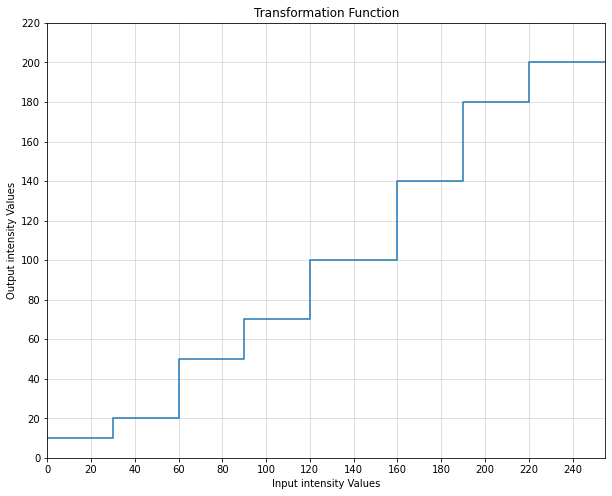

In [4]:
# Values of x-axis
x = np.array([0,30, 60, 90, 120, 160, 190, 220, 255])
# Values of y-axis
y = np.array([10, 20, 50, 70, 100, 140, 180, 200, 200])

fig, ax = plt.subplots(figsize=(10, 8))
plt.step(x, y, where='post')

# Set tick marks and labels on the x-axis
xticks = np.arange(0, 256, 20)
plt.xticks(xticks)

# Set tick marks and labels on the y-axis
yticks = np.arange(0, 221, 20)
plt.yticks(yticks)

# Set axes limit
plt.xlim(0 , 255)
plt.ylim(0 , 220)

plt.title("Transformation Function")
plt.xlabel("Input intensity Values")
plt.ylabel("Output intensity Values")

ax.grid(alpha=0.5)

plt.show()

#### First image (Einstein)

In [5]:
einstein_image = r'albert-einstein_gray.jpg'

In [6]:
einstein_gray = cv2.imread(einstein_image, cv2.IMREAD_GRAYSCALE)

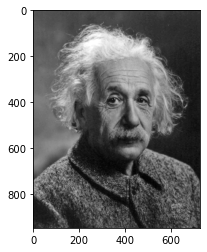

In [7]:
plt.imshow(einstein_gray,cmap='gray')

In [8]:
# Apply the function
einstein_transformed = transformation_function(einstein_gray)

In [9]:
# Convert output to uint8 data type
output_img = np.uint8(einstein_transformed)

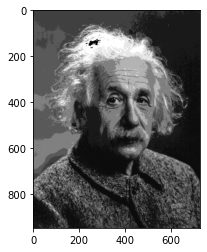

In [10]:
plt.imshow(output_img, cmap='gray')

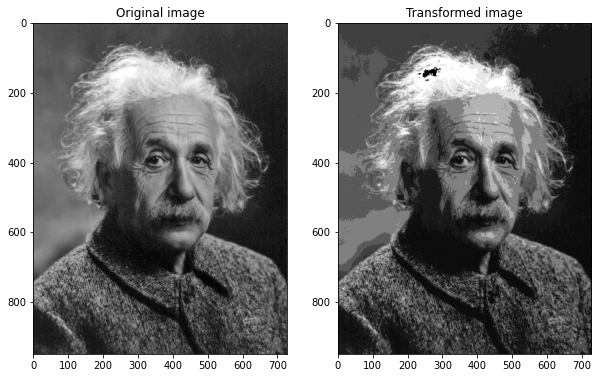

In [11]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (10,10))

# Show the first image in the first subplot
ax1.imshow(einstein_gray, cmap='gray')
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(output_img, cmap='gray')
ax2.set_title('Transformed image')

# Display the figure
plt.show()

#### Second image (Dark Forest)

In [12]:
# Get the path of the current script
current_dir = os.getcwd()

# Specify the filename of the image
filename = "nature_dark_forest.jpg"

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
forest_image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

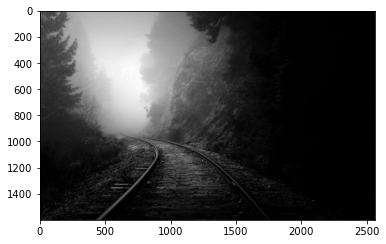

In [13]:
plt.imshow(forest_image,cmap='gray')

In [14]:
# Apply the function
output_forest = transformation_function(forest_image)
# Convert output to uint8 data type
output_forest = np.uint8(output_forest)

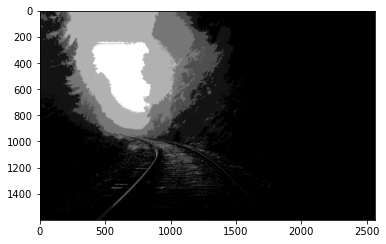

In [15]:
plt.imshow(output_forest, cmap='gray')

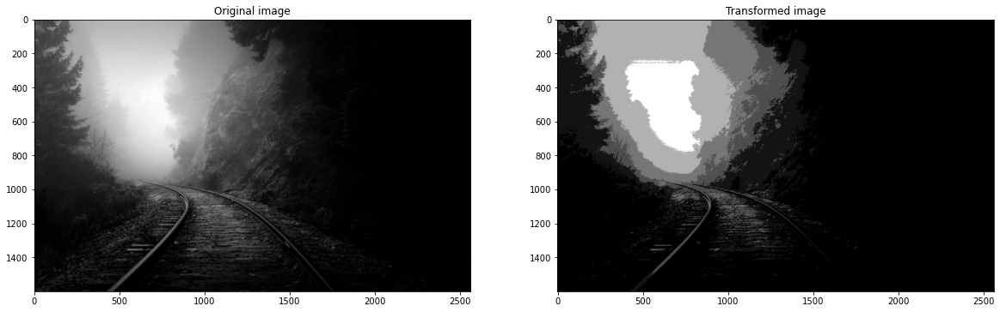

In [16]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(forest_image, cmap='gray')
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(output_forest, cmap='gray')
ax2.set_title('Transformed image')

# Display the figure
plt.show()

## Analysis 2

This analysis has the goal to enhance an image. One method of image enhancement could be color balance adjustment. This technique adjusts the color balance and can thus help to improve the overall color tone of the image. It can be used to bring out more natural-looking colors in the image.

Note that the image is converted to RGB format when loaded with cr2. That is because the default reading of cr2 package is in BGR, but the default visualization with plt.imshow is in RGB. Therefore, to ensure a correct color visualization, all images that are colored and are loaded using cr2 are converted to RGB format from here on out.

In [17]:
# Get the path of the current script
current_dir = os.getcwd()

# Specify the filename of the image
filename = "nature_dark_forest.jpg"

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
forest_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

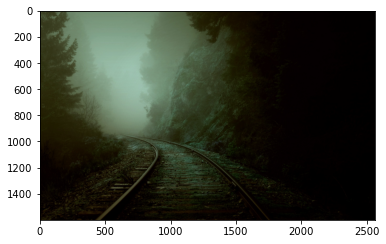

In [18]:
plt.imshow(forest_image)

In [19]:
# Split the image into its three color channels (BGR)
r, g, b = cv2.split(forest_image)

# Calculate the average value of each color channel
b_avg = cv2.mean(b)[0]
g_avg = cv2.mean(g)[0]
r_avg = cv2.mean(r)[0]

# Calculate the maximum average value
max_avg = max(b_avg, g_avg, r_avg)


In [20]:
# Calculate the scaling factors for each channel
b_scale = max_avg / b_avg
g_scale = max_avg / g_avg
r_scale = max_avg / r_avg

# Apply the scaling factors to each channel
b = cv2.convertScaleAbs(b, alpha=b_scale)
g = cv2.convertScaleAbs(g, alpha=g_scale)
r = cv2.convertScaleAbs(r, alpha=r_scale)

In [21]:
# Merge the channels back into the image
img_balanced = cv2.merge((r, g, b))

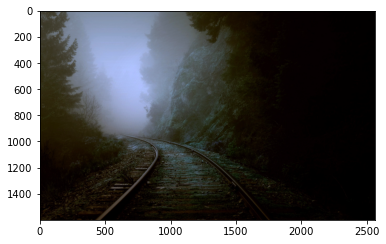

In [22]:
plt.imshow(img_balanced)

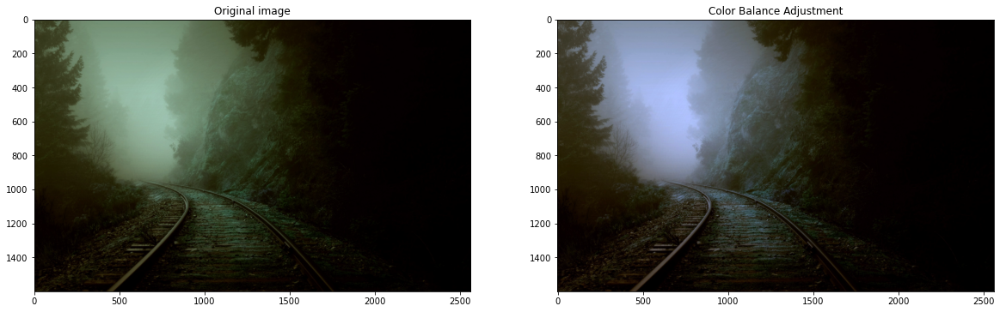

In [23]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(forest_image)
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(img_balanced)
ax2.set_title('Color Balance Adjustment')

# Display the figure
plt.show()

Another technique that could be applied is Histogram equalization. This is a technique for adjusting the contrast of an image by modifying the image's histogram. It can help to bring out more details in both the bright and dark areas of the image.

In [24]:
# Get the path of the current script
current_dir = os.getcwd()

# Specify the filename of the image
filename = "nature_dark_forest.jpg"

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
forest_image = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

In [25]:
# Split the image into its color channels
r, b, g = cv2.split(forest_image)

In [26]:
# Apply histogram equalization to each channel
b_eq = cv2.equalizeHist(b)
g_eq = cv2.equalizeHist(g)
r_eq = cv2.equalizeHist(r)

In [27]:
# Merge the equalized channels back into a single image
img_equalized = cv2.merge((r_eq, b_eq, g_eq))

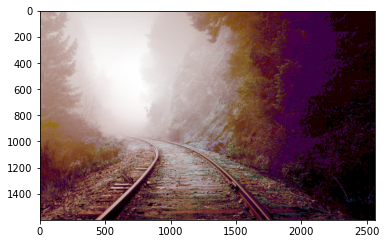

In [28]:
plt.imshow(img_equalized)

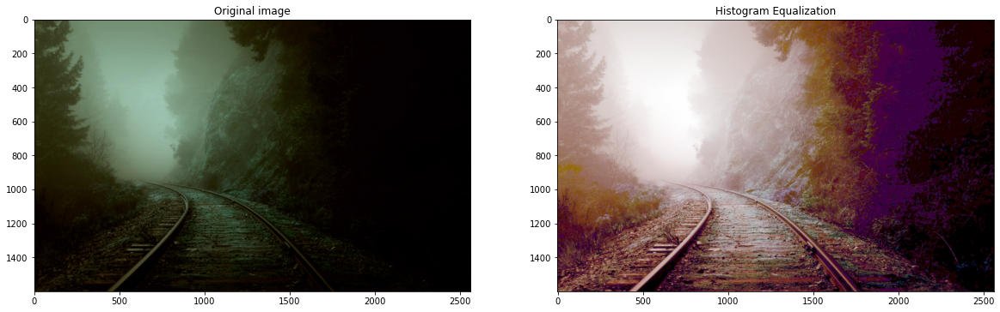

In [29]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(forest_image)
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(img_equalized)
ax2.set_title('Histogram Equalization')

# Display the figure
plt.show()

## Analysis 3

The goal of this analysis was to improve the image in terms of perceived brightness. One technique that can achieve that is Gamma correction. This technique involves applying a nonlinear adjustment to the pixel values in an image to change its brightness and contrast.

In [30]:
# Get the path of the current script
current_dir = os.getcwd()

# Specify the filename of the image
filename = 'pollen-500x430px-96dpi.jpg'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
pollen_image = cv2.imread(image_path)

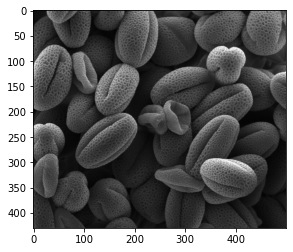

In [31]:
plt.imshow(pollen_image)

In [32]:
# Convert the image to a floating-point format
img_float = pollen_image.astype(np.float32) / 255.0

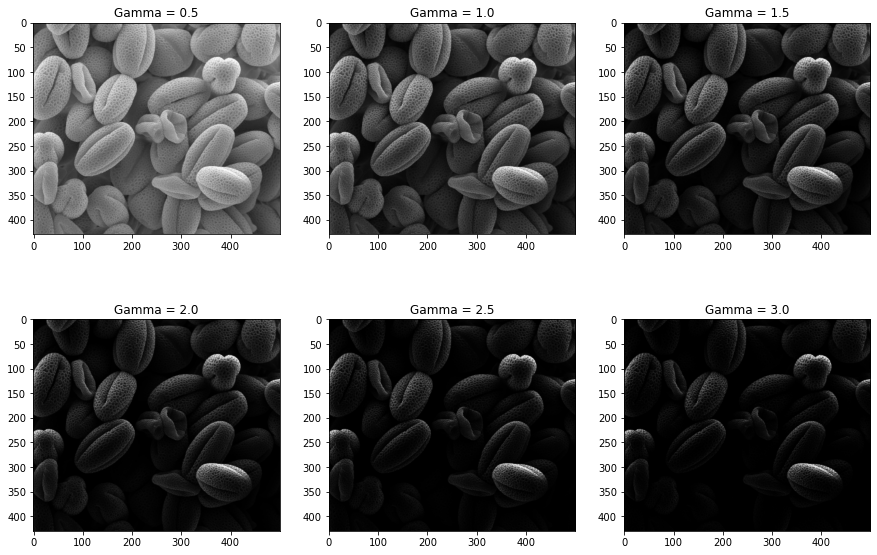

In [33]:
# Apply gamma correction and display the corrected images in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

for i in range(6):
    gamma = (i + 1)/2 # starting gamma is 0.5

    img_corrected = np.power(img_float, gamma)

    # Convert the image back to the original data type and scale the pixel values to the range [0, 255]
    img_corrected = (img_corrected * 255.0).astype(np.uint8)
    
    # Display the corrected image
    row = i // 3
    col = i % 3
    axs[row, col].imshow(img_corrected, cmap='gray')
    axs[row, col].set_title('Gamma = ' + str(gamma))

plt.show()

The more the value of gamma increases the darker the image becomes. On the contrary, gamm values, below 1 (and >0) result in a brighter image. In case we want the image to be less bright but not so much that it loses information, gamma = 1.5 would be a good choice. Of course other gamma values could be more appropriate depending on the specific context and desired used of the image.

In [34]:
# Apply gamma correction
gamma = 1.5
img_corrected = np.power(img_float, gamma)

# Convert the image back to the original data type and scale the pixel values to the range [0, 255]
img_corrected = (img_corrected * 255.0).astype(np.uint8)

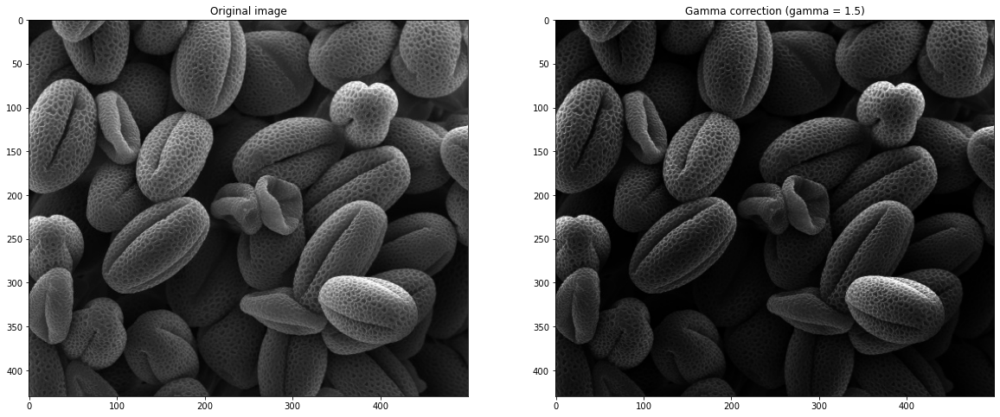

In [35]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(pollen_image)
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(img_corrected)
ax2.set_title('Gamma correction (gamma = ' + str(gamma) + ')')

# Display the figure
plt.show()

## Analysis 4

The goal of this analysis was the sharpening of images. Two techniques were applied and compared. The first one was the Unsharp Masking technique. The second was the Negative Sharpening technique. Negative sharpening produced much better results than the Unsharp Masking. 

In [36]:
# Get the path of the current script
current_dir = os.getcwd()

# Specify the filename of the image
filename = 'First-photo-of-the-moon-from-Chandrayaan-2_ISRO.jpg'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
moon_image = cv2.imread(image_path)

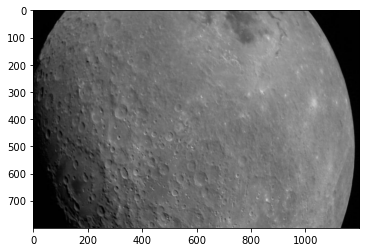

In [37]:
plt.imshow(moon_image)

In [38]:
# Convert to grayscale
gray = cv2.cvtColor(moon_image, cv2.COLOR_BGR2GRAY)

### Technique 1: Unsharp Masking

This technique involves creating a blurred version of the image, subtracting it from the original image, and then adding the resulting image to the original image. This process enhances the edges and details in the image, resulting in a sharper appearance.

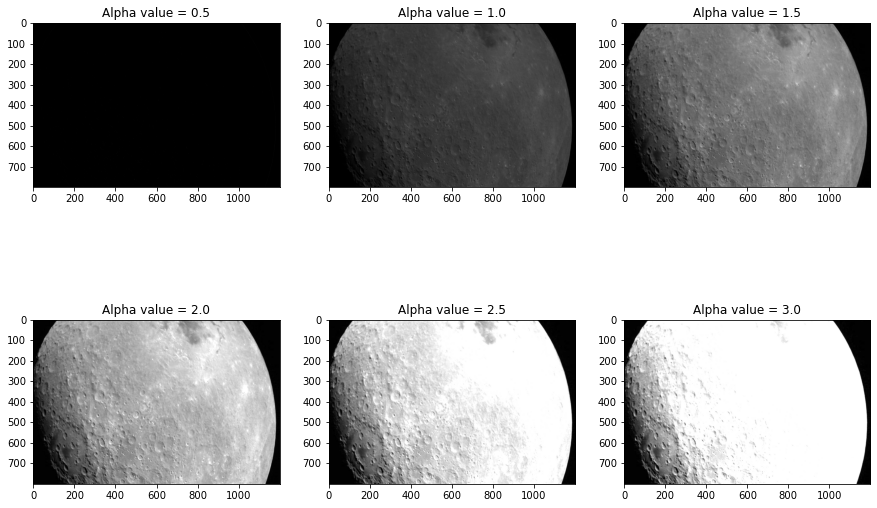

In [39]:
# Apply Unsharp masking and display the corrected images in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

for i in range(6):
    alpha = (i + 1) / 2 # alpha value starts from 1

    # Apply Gaussian blur to the grayscale image
    blurred = cv2.GaussianBlur(gray, (5,5), 0)

    # Calculate the unsharp mask
    unsharp_mask = cv2.addWeighted(gray, alpha, blurred, -0.5, 0)

    # Apply the unsharp mask to the original image
    sharpened = cv2.cvtColor(unsharp_mask, cv2.COLOR_GRAY2BGR)
    
    # Display the corrected image
    row = i // 3
    col = i % 3
    axs[row, col].imshow(sharpened, cmap='gray')
    axs[row, col].set_title('Alpha value = ' + str(alpha))

plt.show()

Unsharp masking is defined by three things, the Gaussian noise kernel, the beta value and the alpha value. The Gaussian kernel applies the blurring. Here a small kernel was chosen to apply as less noise as possible in the image. The beta vaue dictates how much blur will be applied to the image. Since the goal was to sharpen it a value of -0.5 was set to apply a bare minimum of blurring without distorting the image. The alpha value dictates how sharpened the image will become. Multiple values were tested for this term, but it appears that a value of 2.0 is enough to sharpen the image nicely.

In [40]:
# Apply Gaussian blur to the grayscale image
blurred = cv2.GaussianBlur(gray, (5,5), 0)

# Calculate the unsharp mask
unsharp_mask = cv2.addWeighted(gray, 2, blurred, -0.5, 0)

In [41]:
# Apply the unsharp mask to the original image
sharpened = cv2.cvtColor(unsharp_mask, cv2.COLOR_GRAY2BGR)

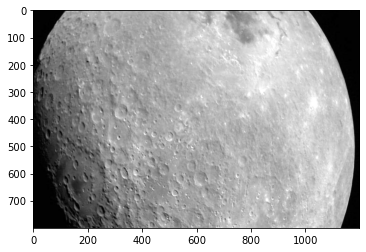

In [42]:
plt.imshow(sharpened)

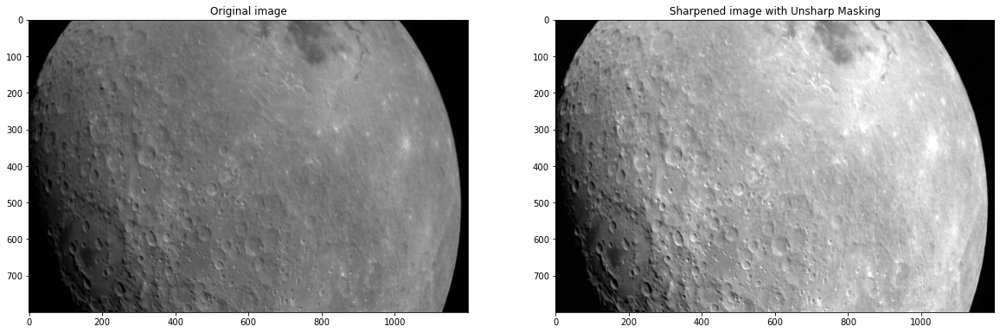

In [43]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(moon_image)
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(sharpened)
ax2.set_title('Sharpened image with Unsharp Masking')

# Display the figure
plt.show()

### Technique 2: Negative Sharpening

Another technique that can be applied to sharpen an image is Negative Sharpening. Negative sharpening is a type of image sharpening technique that enhances the edges of an image while also reducing the noise or grain in the image. It works by first applying a smoothing filter to the image to reduce the noise, and then subtracting the smoothed image from the original image to create an image that highlights the edges. It was chosen instead of positive sharpening because it produces images that are more blurry and noisy, whihc we want to achieve here, while positive sharpening produced images that are of better visual quality, with less noise.

To apply the technique to the image, a Gaussian kernel was introduced and then it was applied as a filter to the original image.

In [44]:
# Create the sharpening kernel
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

# Apply the sharpening kernel to the image using filter2D
sharpened_img = cv2.filter2D(gray, -1, kernel)

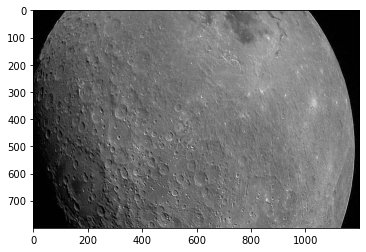

In [45]:
plt.imshow(sharpened_img, cmap = 'gray')

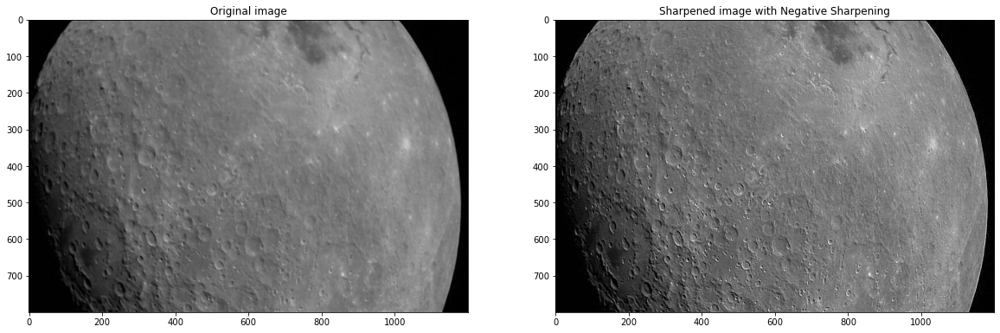

In [46]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(moon_image, cmap = 'gray')
ax1.set_title('Original image')

# Show the second image in the second subplot
ax2.imshow(sharpened_img, cmap = 'gray')
ax2.set_title('Sharpened image with Negative Sharpening')

# Display the figure
plt.show()

The Negative Sharpening technique gave much better results than the Unsharp Masking technique in terms of image sharpening. Therefore, Negative Sharpening is chosen as the best option in this case.

## Analysis 5

In this analysis two versions of the same image were used (original and transformed one). The analysis involved transformation from one image to the other.

* 5.a. a guess of the processes adapted to transform Image 1 to Image 2.
* 5.b.1. transforming Image 1 to Image 2
* 5.b.2. transforming Image 2 to Image 1

### 5.a.

First we need to visualize the two images, in order to figure out the differences between Image 1 and Image 2.

In [47]:
# Get the path of the current script
current_dir = os.getcwd()

In [48]:
# For image 1

# Specify the filename of the image
filename = 'image_1.jpg'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image_1 = cv2.imread(image_path, cv2.COLOR_BGR2GRAY)

In [49]:
# For image 2

# Specify the filename of the image
filename = 'image_2.jpg'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image_2 = cv2.imread(image_path, cv2.COLOR_BGR2GRAY)

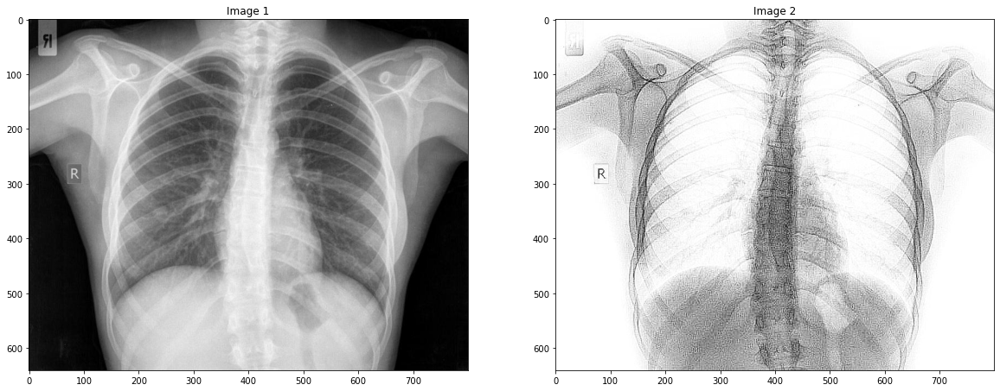

In [50]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image_1, cmap = 'gray')
ax1.set_title('Image 1')

# Show the second image in the second subplot
ax2.imshow(image_2, cmap = 'gray')
ax2.set_title('Image 2')

# Display the figure
plt.show()

The two images differ significantly. A first guess of the transformations applied to Image 2 indicates an introduction of noise (grainy effect). Furthermore, it appears that the image has been inverted (black areas of Image 1 are white in Image 2). A third effect of sharpening seems to have been applied to the image as the edges of the bones appear more pronounced than its counterpart. Some form of filtering has been applied to achieve this effect, perhaps a high-pass filter has been used to sharpen the image and improve its contrast, while also introducing the afformentioned noise. Based on these observations we will try and recreate the effect of Image 2 on 5.b. below.

### 5.b.1.

#### From Image 1 to Image 2

The following pipeline is proposed in order to change Image 1 to match Image 2.

* Gamma correction to change brightness and contrast.
* Inversion to change black areas into white and vice versa.
* Negative sharpening with a Gaussian kernel to sharpen the image while also introducing some light noise.
* High-pass filtering through convolution with a kernel to apply even more noise to the image.

This pipeline is presented in the code below.

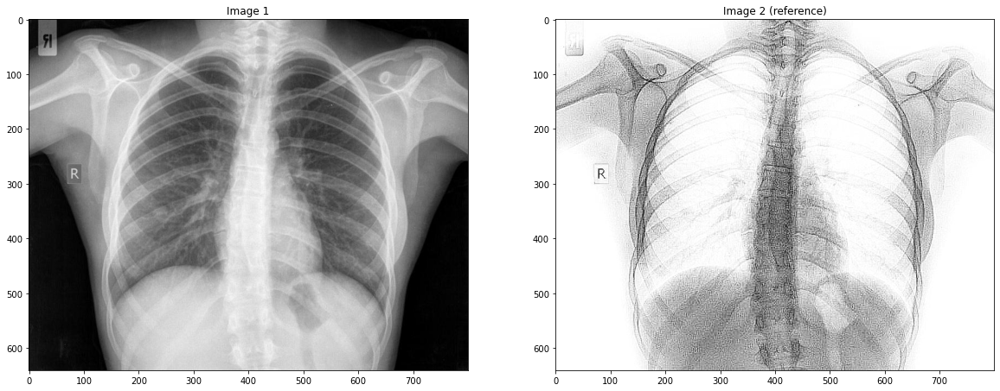

In [51]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image_1, cmap = 'gray')
ax1.set_title('Image 1')

# Show the second image in the second subplot
ax2.imshow(image_2, cmap = 'gray')
ax2.set_title('Image 2 (reference)')

# Display the figure
plt.show()

In [52]:
# Compute the mean and standard deviation of the pixel intensities for image 1
mean_1 = np.mean(image_1)
std_1 = np.std(image_1)

# Compute the mean and standard deviation of the pixel intensities for image 2
mean_2 = np.mean(image_2)
std_2 = np.std(image_2)

print('Pixel intensity: ')
print("Image 1 - Mean: {:.2f}, Standard Deviation: {:.2f}".format(mean_1, std_1))
print("Image 2 - Mean: {:.2f}, Standard Deviation: {:.2f}".format(mean_2, std_2))

Pixel intensity: 
Image 1 - Mean: 121.46, Standard Deviation: 68.20
Image 2 - Mean: 217.60, Standard Deviation: 48.98


The two images differ significantly both in pixel intensity and brightness, contrast, among other things. The first adjustment that will be made is to apply gamma correction to the image. As mentioned on the previous exercise this is a technique that applies a power function to the pixel values of an image, which changes the brightness and contrast of the image. This is needed in this case to achieve the desired effect of "whitening" the lungs and contrasting them with the rest of the body. Different gamma values were applied to visualize the best one. Furthermore, all gamma corrected images were also inverted to match the white and black areas of the desired Image 2.

In [53]:
# Convert the image to a floating-point format
matched_image_float = image_1.astype(np.float32) / 255.0

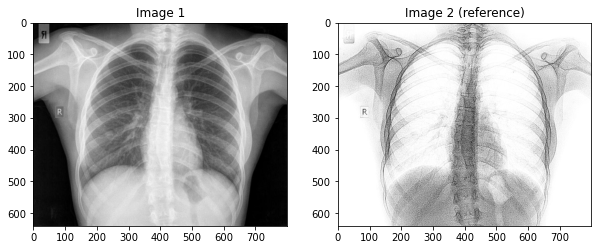

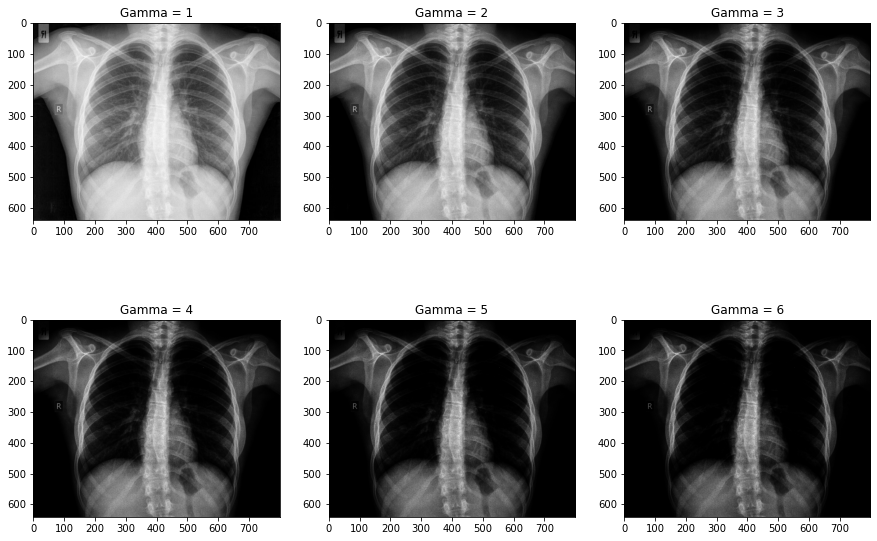

In [54]:
# Display original images and titles in a single row
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image_1, cmap='gray')
axs[0].set_title('Image 1')
axs[1].imshow(image_2, cmap='gray')
axs[1].set_title('Image 2 (reference)')
plt.show()

# Apply gamma correction and display the corrected images in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
for i in range(6):
    gamma = i + 1 # add 1 to start with gamma = 1

    img_corrected = np.power(matched_image_float, gamma)

    # Convert the image back to the original data type and scale the pixel values to the range [0, 255]
    img_corrected = (img_corrected * 255.0).astype(np.uint8)
    
    # Display the corrected image
    row = i // 3
    col = i % 3
    axs[row, col].imshow(img_corrected, cmap='gray')
    axs[row, col].set_title('Gamma = ' + str(gamma))

plt.show()


As observed in the above images gamma 3 or 4 corrected images come pretty close to the effect of Image 2. Of course, as mentioned, the results need to be inverted to have a clearer result, which is done below.

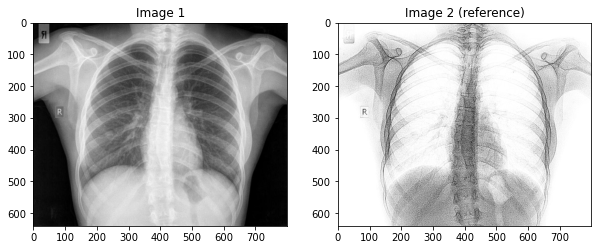

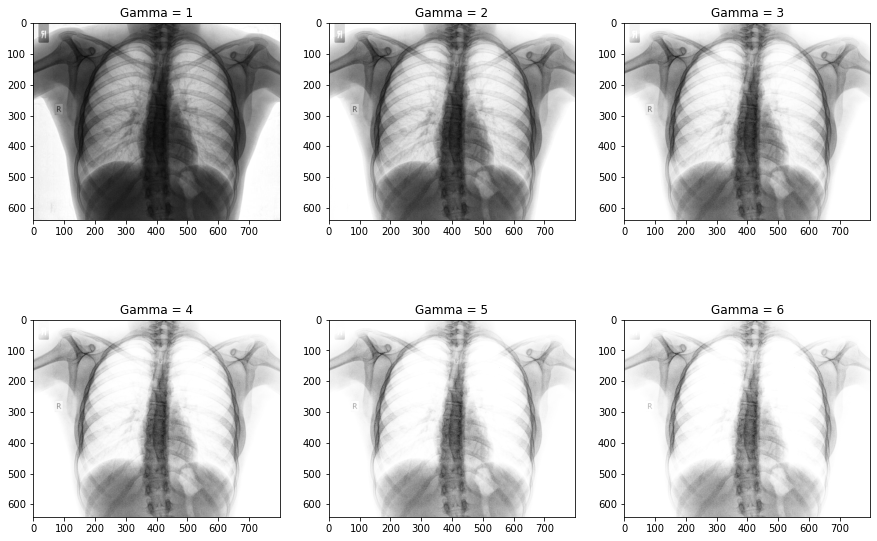

In [55]:
# Display original images and titles in a single row
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(image_1, cmap='gray')
axs[0].set_title('Image 1')
axs[1].imshow(image_2, cmap='gray')
axs[1].set_title('Image 2 (reference)')
plt.show()

# Apply gamma correction and inversion to the corrected images, then display them in a 2x3 grid
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
for i in range(6):
    gamma = i + 1 # add 1 to start with gamma = 1

    img_corrected = np.power(matched_image_float, gamma)

    # Convert the image back to the original data type and scale the pixel values to the range [0, 255]
    img_corrected = (img_corrected * 255.0).astype(np.uint8)
    
    # Apply inversion to the corrected image
    img_inverted = 255 - img_corrected
    
    # Display the corrected and inverted image
    row = i // 3
    col = i % 3
    axs[row, col].imshow(img_inverted, cmap='gray')
    axs[row, col].set_title('Gamma = ' + str(gamma))

plt.show()


It appears that gamma 4 image is the one closest to Image 2. The two are further visualized to focus on more differences between them that have to be adjusted.

In [56]:
# Apply gamma correction
gamma = 4
img_corrected = np.power(matched_image_float, gamma)

# Convert the image back to the original data type and scale the pixel values to the range [0, 255]
img_corrected = (img_corrected * 255.0).astype(np.uint8)

In [57]:
# Invert the contrast and brightness
inverted_img = 255 - img_corrected

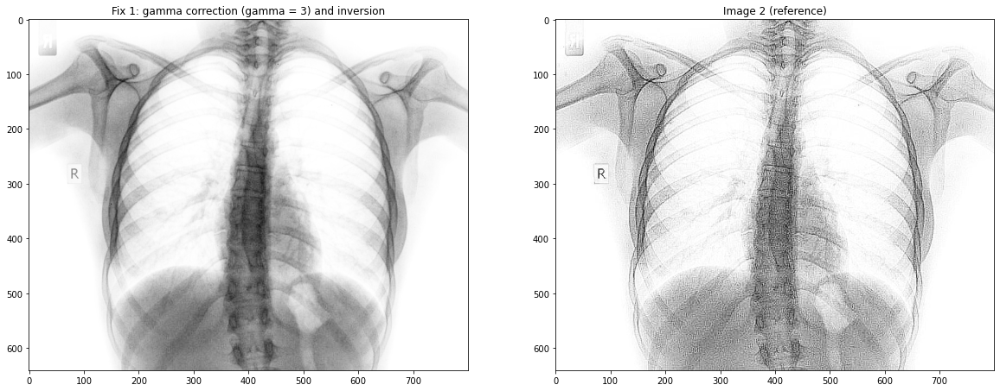

Pixel intensity: 
Image 1 (gamma fix + inversion) - Mean: 218.73, Standard Deviation: 41.19
Image 2 - Mean: 217.60, Standard Deviation: 48.98


In [58]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(inverted_img, cmap = 'gray')
ax1.set_title('Fix 1: gamma correction (gamma = 3) and inversion')

# Show the second image in the second subplot
ax2.imshow(image_2, cmap = 'gray')
ax2.set_title('Image 2 (reference)')

# Display the figure
plt.show()

# Compute the mean and standard deviation of the pixel intensities for image 1
mean_1 = np.mean(inverted_img)
std_1 = np.std(inverted_img)

# Compute the mean and standard deviation of the pixel intensities for image 2
mean_2 = np.mean(image_2)
std_2 = np.std(image_2)

print('Pixel intensity: ')
print("Image 1 (gamma fix + inversion) - Mean: {:.2f}, Standard Deviation: {:.2f}".format(mean_1, std_1))
print("Image 2 - Mean: {:.2f}, Standard Deviation: {:.2f}".format(mean_2, std_2))

The images now have the same effect in contrast and brightness and their average pixel intensity values are nearly similar. However, they still differ in two things, as Image 2 has sharper edges and a grainy (noisy) effect compared to the image that has been processed so far. First, the sharper edges difference will be adressed, by applying negative sharpening to the image. 

Negative sharpening is a type of image sharpening technique that enhances the edges of an image while also reducing the noise or grain in the image. It works by first applying a smoothing filter to the image to reduce the noise, and then subtracting the smoothed image from the original image to create an image that highlights the edges. It was chosen instead of positive sharpening because it produces images that are more blurry and noisy, whihc we want to achieve here, while positive sharpening produced images that are of better visual quality, with less noise.

To apply the technique to the image, a Gaussian filter was introduced. Then the smoothed image was subtracted from the previous version to obtain the sharpened image. The contrast and brightness of the sharpened image was also adjusted accordingly.

In [59]:
# Create the sharpening kernel
kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])

# Apply the sharpening kernel to the image using filter2D
sharpened_img = cv2.filter2D(inverted_img, -1, kernel)

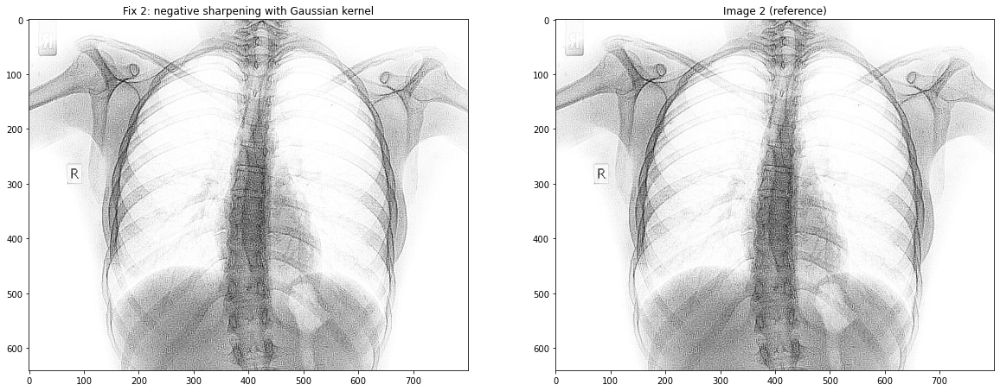

In [60]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(sharpened_img, cmap = 'gray')
ax1.set_title('Fix 2: negative sharpening with Gaussian kernel')

# Show the second image in the second subplot
ax2.imshow(image_2, cmap = 'gray')
ax2.set_title('Image 2 (reference)')

# Display the figure
plt.show()

The final adjustions need to be made to approximate the grainy effect of Image 2. For that to happen a high pass filter will be placed on the image. A high-pass filter is a type of image filter that allows high-frequency information to pass through while blocking low-frequency information. In other words, it is designed to enhance the edges and details of an image by removing the low-frequency information such as smooth variations in intensity or color. It will be implemented through convolution with a kernel. Here it will help achieve the grainy effect, by adding some random noise to the image.

In [61]:
kernel = np.array([[0.5, 0.5, 0.5],
                   [0.5, -3, 0.5],
                   [0.5, 0.5, 0.5]])

noise = np.random.normal(loc=0, scale=15, size=sharpened_img.shape)
noisy_image = sharpened_img.astype(np.float32) + noise
noisy_image = np.clip(noisy_image, 0, 255).astype(np.uint8)


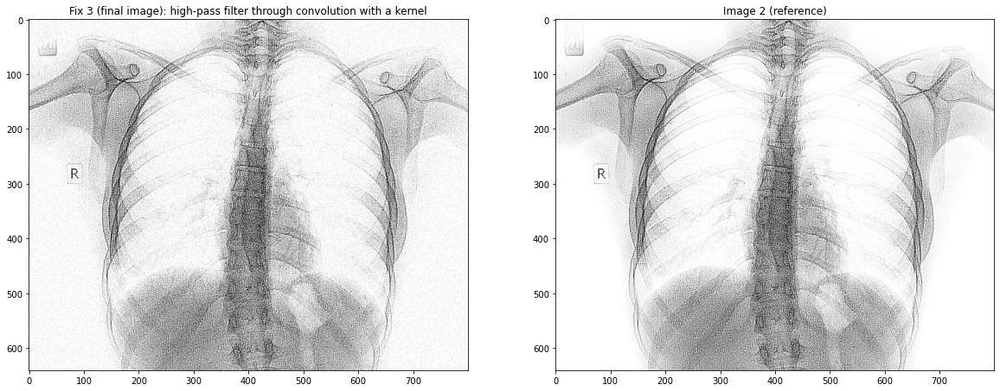

In [62]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(noisy_image, cmap = 'gray')
ax1.set_title('Fix 3 (final image): high-pass filter through convolution with a kernel')

# Show the second image in the second subplot
ax2.imshow(image_2, cmap = 'gray')
ax2.set_title('Image 2 (reference)')

# Display the figure
plt.show()


It appears that Image 1 has finally reached the effect of Image 2.

### 5.b.2.

#### From Image 2 to Image 1

Now we have to peform the operations the other way around to approximate Image 1 starting from Image 2. Fist, the two images are visualized again.

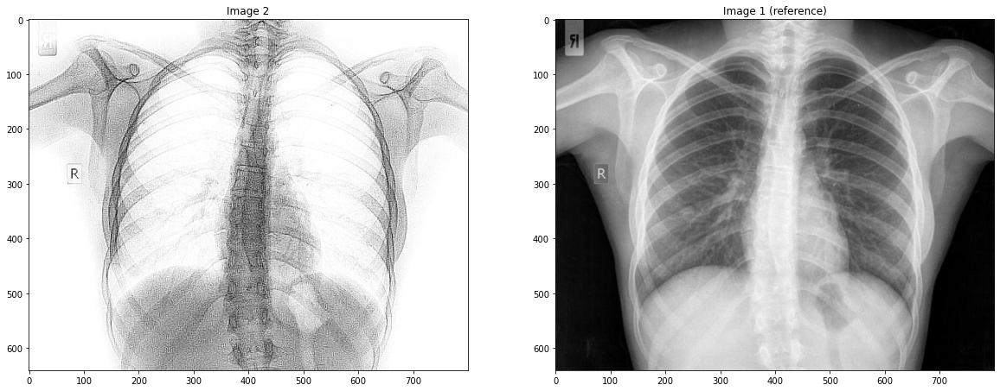

In [63]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image_2, cmap = 'gray')
ax1.set_title('Image 2')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

Much like the previous implementation the gamma value needs to be adjusted and the image also has to be inversed so that the black areas can become white and vice versa. The appropriate gamma value was found through trial and error again.

In [64]:
# Convert the image to a floating-point format
matched_image_float = image_2.astype(np.float32) / 255.0

In [65]:
# Apply gamma correction
gamma = 0.5 
img_corrected = np.power(matched_image_float, gamma)

# Convert the image back to the original data type and scale the pixel values to the range [0, 255]
img_corrected = (img_corrected * 255.0).astype(np.uint8)

# Invert the image
img_corrected = 255 - img_corrected


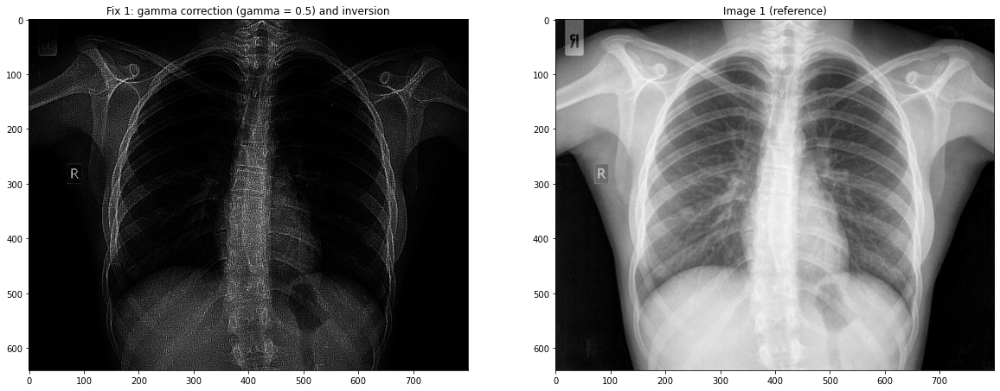

In [66]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(img_corrected, cmap='gray')
ax1.set_title('Fix 1: gamma correction (gamma = 0.5) and inversion')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

After that a low-pass filter was passed in the image, to create the opposite effect that the high pass filter has created in the previous implementation. Low-pass filter is a technique that removes high-frequency noise and smooths the image, which is exactly what is needed in this case, in order to deblur Image 2 and also smoothen it to achieve the effect Image 1 has.

In [67]:
# Define the kernel size for the low-pass filter
kernel_size = 5

# Create a kernel for the low-pass filter
kernel = np.ones((kernel_size, kernel_size), np.float32) / (kernel_size * kernel_size)

# Apply the low-pass filter to the image
filtered_img = cv2.filter2D(img_corrected, -1, kernel)

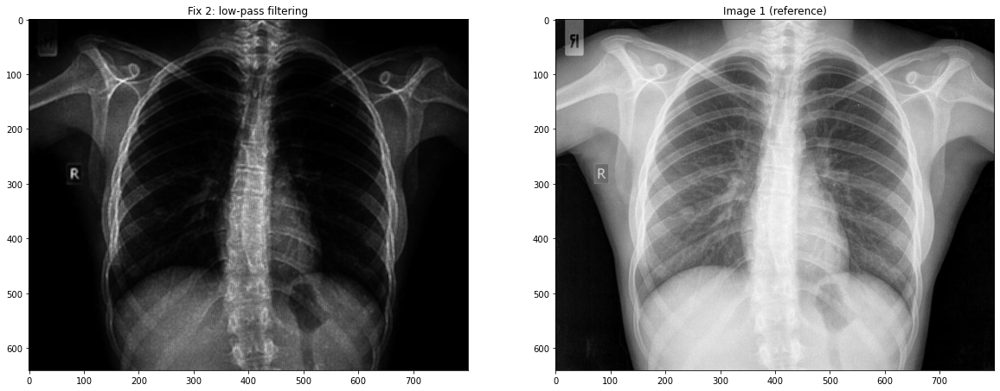

In [68]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(filtered_img, cmap = 'gray')
ax1.set_title('Fix 2: low-pass filtering')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

Next, histogram equalization was implemented to adjust the pixel values in such a way that it would improve the contrast and dynamic range of the image. 

In [69]:
# Apply histogram equalization
equalized_img = cv2.equalizeHist(filtered_img)

# Apply Gaussian filter to reduce pixelation
equalized_img = cv2.GaussianBlur(equalized_img, (5, 5), 0)

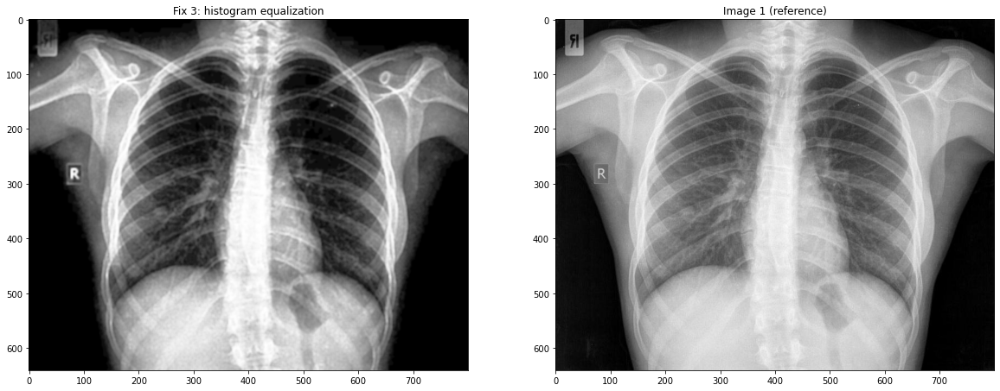

In [70]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(equalized_img, cmap='gray')
ax1.set_title('Fix 3: histogram equalization')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

To adress the addition of noise that histogram equalization inadvertadly does, Gaussian blurring was applied to mask the pixelated effect

In [71]:
# Apply the Gaussian filter with a kernel size of 5
blurred_img = cv2.GaussianBlur(equalized_img, (5, 5), 0)

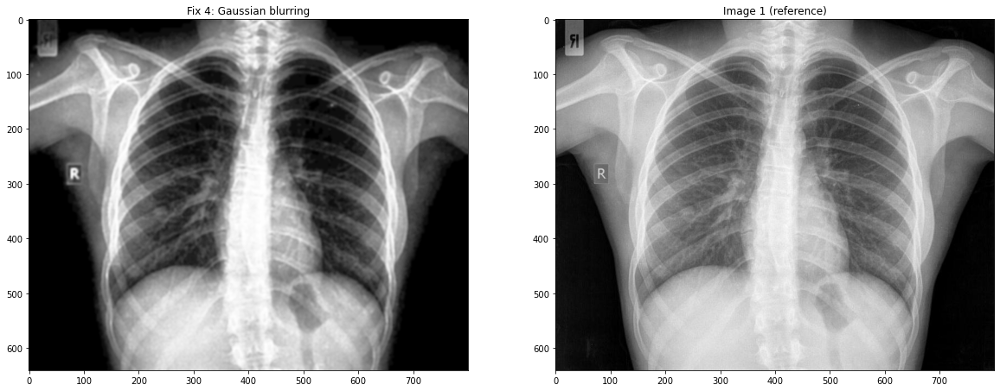

In [72]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(blurred_img, cmap='gray')
ax1.set_title('Fix 4: Gaussian blurring')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

Next, Unsharp Masking was applied to the image in order to sharpen it, while also introducing a light blur to further mask the pixelated effect and bring the image closer to the smooth appearence of Image 1. This technique was chosen instead of Negative Sharpening that was also applied in exercise 4, exactly because of the desire to further apply Gaussian noise.

In [73]:
# Apply Gaussian blur to the grayscale image
blurred = cv2.GaussianBlur(img_corrected, (9,9), 0)

# Calculate the unsharp mask
unsharp_mask = cv2.addWeighted(image_1, 1, blurred, -0.5, 0)

In [74]:
# Apply the unsharp mask to the original image
sharpened = cv2.cvtColor(unsharp_mask, cv2.COLOR_GRAY2BGR)

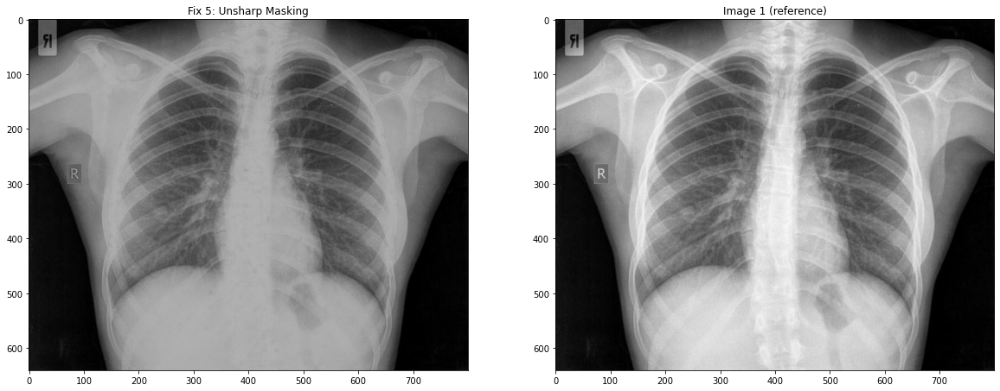

In [75]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(sharpened, cmap='gray')
ax1.set_title('Fix 5: Unsharp Masking')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

The image is now very close to Image 1. However, a slight increase in contrasting was applied to bring out the details of the bones and the lungs. This was achieved through Contrast stretching, which is a technique that improves the contrast of an image by stretching its histogram to cover the full dynamic range of pixel values. In the code this happens by calculating a linear mapping function, that maps the min and max input pixel values to the min and max output pixel values.

In [76]:
# Define the minimum and maximum pixel values for the output range
min_output = 0
max_output = 255

# Find the minimum and maximum pixel values in the input image
min_input = np.min(sharpened)
max_input = np.max(sharpened)

# Calculate the slope and intercept of the linear mapping
slope = (max_output - min_output) / (max_input - min_input)
intercept = min_output - slope * min_input

# Apply the linear mapping to the input image
contrast_stretched_img = np.clip(slope * sharpened + intercept, 0, 255).astype(np.uint8)

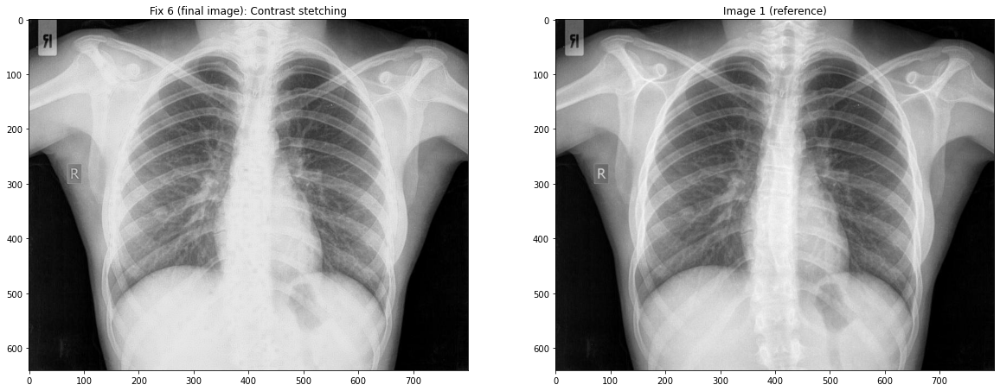

In [77]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(contrast_stretched_img, cmap='gray')
ax1.set_title('Fix 6 (final image): Contrast stetching')

# Show the second image in the second subplot
ax2.imshow(image_1, cmap = 'gray')
ax2.set_title('Image 1 (reference)')

# Display the figure
plt.show()

It appears that Image 2 has finally reached the effect of Image 1.

## Exercise 6

### 6.a.

In [78]:
# Get the path of the current script
current_dir = os.getcwd()

In [79]:
# Specify the filename of the image
filename = 'image11.jpg'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image11 = cv2.imread(image_path, cv2.COLOR_BGR2RGB)

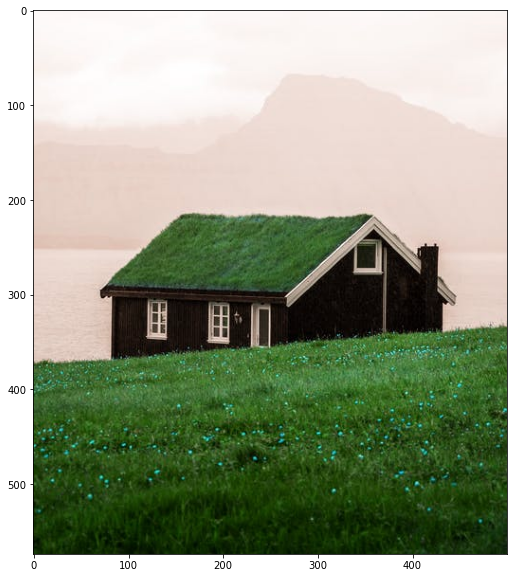

In [80]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image11)

In [81]:
# Apply Gaussian blur to reduce noise
image11_blur = cv2.GaussianBlur(image11, (3, 3), 0)

# Apply Canny edge detector
image11_edges = cv2.Canny(image11_blur, 200, 400)

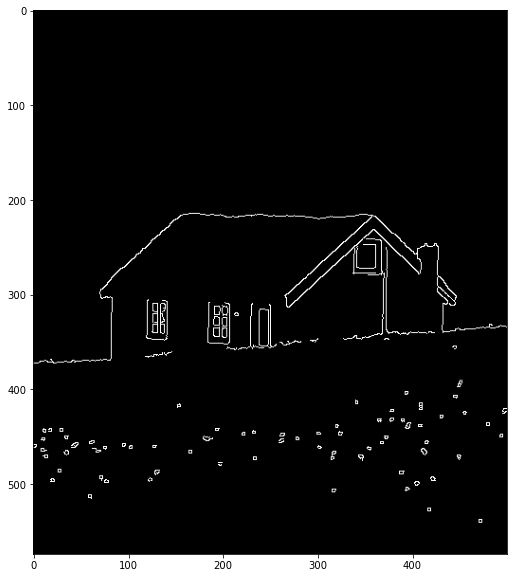

In [82]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image11_edges, cmap = 'gray')

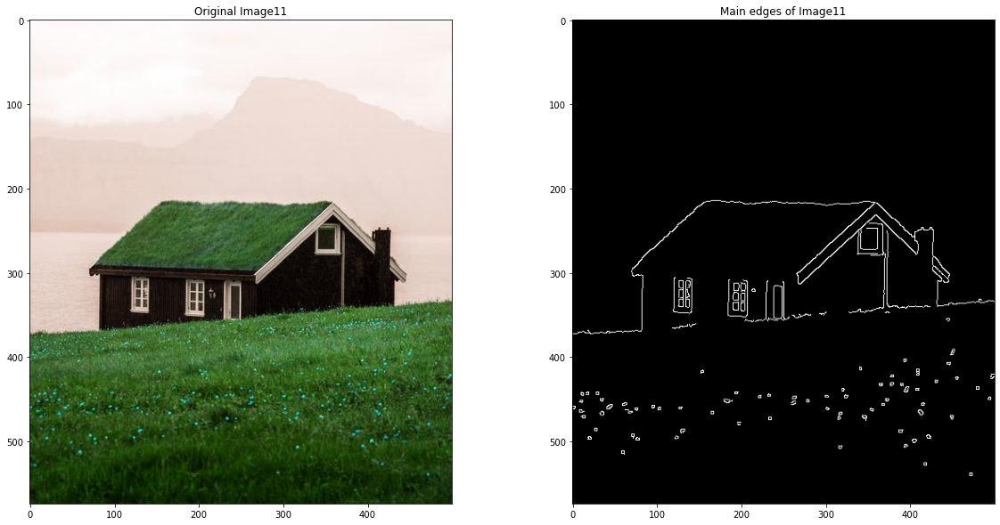

In [83]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image11, cmap='gray')
ax1.set_title('Original Image11')

# Show the second image in the second subplot
ax2.imshow(image11_edges, cmap='gray')
ax2.set_title('Main edges of Image11')

# Display the figure
plt.show()

### 6.b.

In order to estimate the angle (with respect to the horizontal axis) of the diagonal edges of the roof Hough transform is applied to detect lines. This way the two most prominent lines are detected (which correspond to the two strongest peaks i.e. the diagonal edges of the roof). The code finally converts the angle from radians to degrees.

In [84]:
from skimage.transform import hough_line, hough_line_peaks

In [85]:
# Check if the image is grayscale
if len(image11_edges.shape) == 2:
    print("The image is grayscale")
else:
    print("The image is not grayscale.")

The image is grayscale


In [86]:
# Apply Hough transform to detect lines
h, theta, d = hough_line(image11_edges)

In [87]:
# Find the two strongest peaks (corresponding to the two most prominent lines)
_, angles, dists = hough_line_peaks(h, theta, d, num_peaks=4)

In [88]:
# Convert the angle in radians to degrees and print the result
angle_deg = np.degrees(angles[0])
print(f"The angle of the diagonal edges of the roof with respect to the horizonta axis is approximately {angle_deg:.2f} degrees.")

The angle of the diagonal edges of the roof with respect to the horizonta axis is approximately 47.00 degrees.


### 6.c.

To detect the corners of the image the Harris corner detection algorithm was implemented. This is a computer vision algorithm used for detecting corners in digital images. It works by identifying points in an image that have a high variation in intensity when moved in any direction. These points are called "corners" and can be used to identify features of an image. The way the algorithm operates is that it computes the "corner response function" for each pixel in an image. The corner response function is a value that measures the amount of variation in intensity that occurs when a small window around the pixel is moved in any direction. Pixels that have a high value for the corner response function are likely to be corners.

The corners were detected using the Harris algorithm and then a threshold was applied to keep only the strongest corners. Then the indices of the remaining corners were found using np.argwhere(). Finally, the code draws green circles at the corner locations on a copy of the original image image11 using cv2.circle() to showcase the corners.

In [89]:
# Apply Harris corner detection algorithm
dst = cv2.cornerHarris(image11_edges, 2, 3, 0.04)

# Threshold the resulting image to keep only the strongest corners
dst_thresh = dst > 0.01 * dst.max()

# Find the indices of the remaining corners
corners = np.argwhere(dst_thresh)

# Draw circles at the corner locations on a copy of the original image
image_with_corners = image11.copy()
for corner in corners:
    x, y = corner
    cv2.circle(image_with_corners, (y, x), 1, (0, 255, 0), 1)


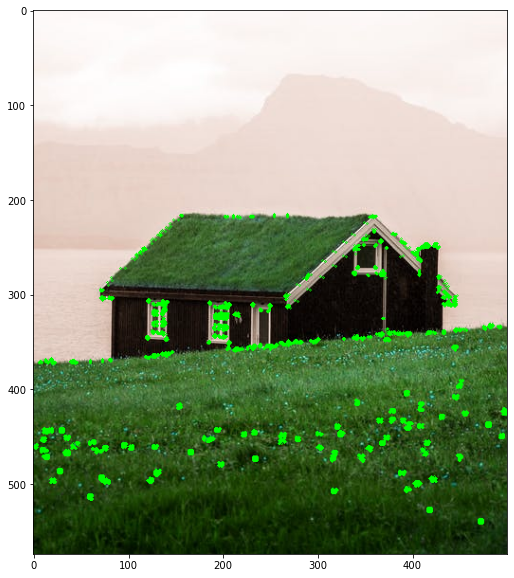

In [90]:
# Display the resulting image
fig, ax = plt.subplots(figsize=(10, 10))
plt.imshow(image_with_corners)

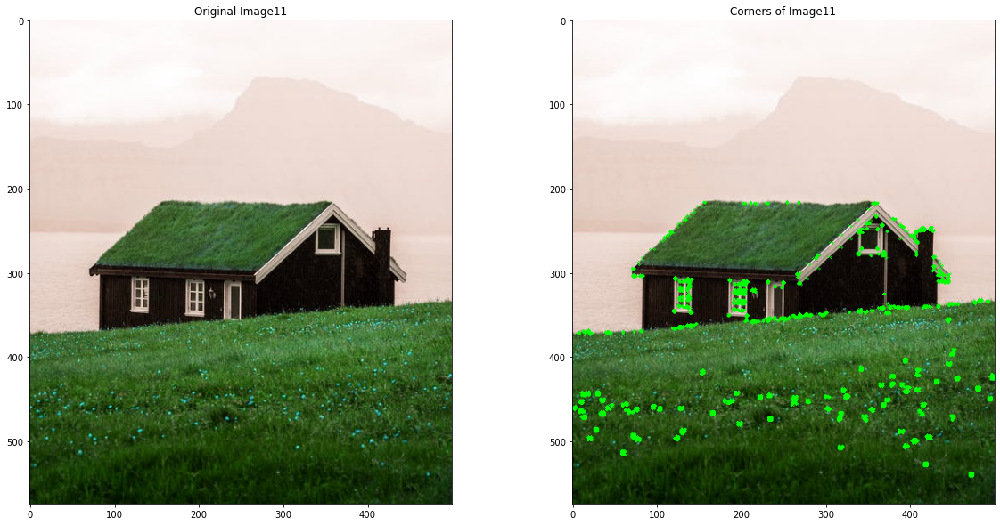

In [91]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image11, cmap='gray')
ax1.set_title('Original Image11')

# Show the second image in the second subplot
ax2.imshow(image_with_corners, cmap='gray')
ax2.set_title('Corners of Image11')

# Display the figure
plt.show()

### 6.d. 

First we set a threshold to remove the corners of the pixels that have green as the prevalent color channel from the consideration, because the windows don't have green as the prevalent color channel.

In [92]:
# Define the green threshold (adjust as needed)
green_threshold = 45

# Apply Harris corner detection algorithm
dst_2 = cv2.cornerHarris(image11_edges, 2, 3, 0.04)

# Threshold the resulting image to keep only the strongest corners
dst_thresh_2 = dst > 0.01 * dst.max()

# Find the indices of the remaining corners
corners_2 = np.argwhere(dst_thresh)

# Exclude corners with green as the prevalent channel value
corners_without_green = []
for corner in corners:
    x, y = corner
    if image11[x, y, 1] < green_threshold:
        corners_without_green.append(corner)

# Draw circles at the corner locations on a copy of the original image
image_with_corners_2 = image11.copy()
for corner in corners_without_green:
    x, y = corner
    cv2.circle(image_with_corners_2, (y, x), 1, (0, 255, 0), 1)


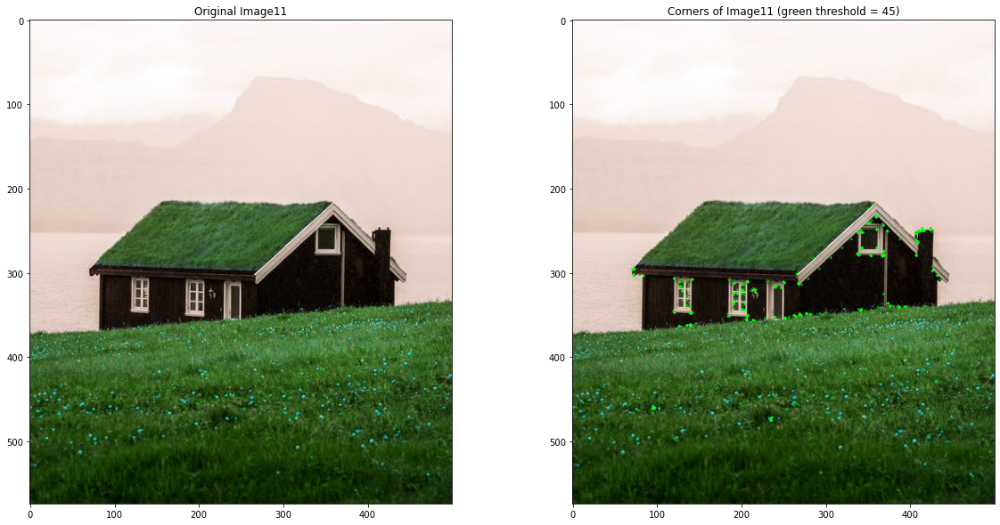

In [93]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image11, cmap='gray')
ax1.set_title('Original Image11')

# Show the second image in the second subplot
ax2.imshow(image_with_corners_2, cmap='gray')
ax2.set_title('Corners of Image11 (green threshold = ' + str(green_threshold) + ')')

# Display the figure
plt.show()

Now we try to find corners in the image that form rectangles or squares with one another, as these are the shapes of the windows.

In [94]:
# Define the tolerance for perpendicularity
tolerance = 5

# Define the minimum and maximum size of the rectangles to be drawn
min_size = 90
max_size = 120

# Draw rectangles around the corners that form rectangles with one another
image_with_rectangles = image_with_corners_2.copy()

for i, corner1 in enumerate(corners_without_green[:-1]):
    for corner2 in corners_without_green[i+1:]:
        x1, y1 = corner1
        x2, y2 = corner2
        # Check if the corners form a rectangle with one another
        if abs(x1-x2) == abs(y1-y2):
            # Check if the rectangle size is within the specified limits
            size = abs(x1-x2) * abs(y1-y2)
            if min_size <= size <= max_size:
                # Draw a rectangle around the corners
                cv2.rectangle(image_with_rectangles, (y1-5, x1-5), (y2+5, x2+5), (0, 0, 255), 2)


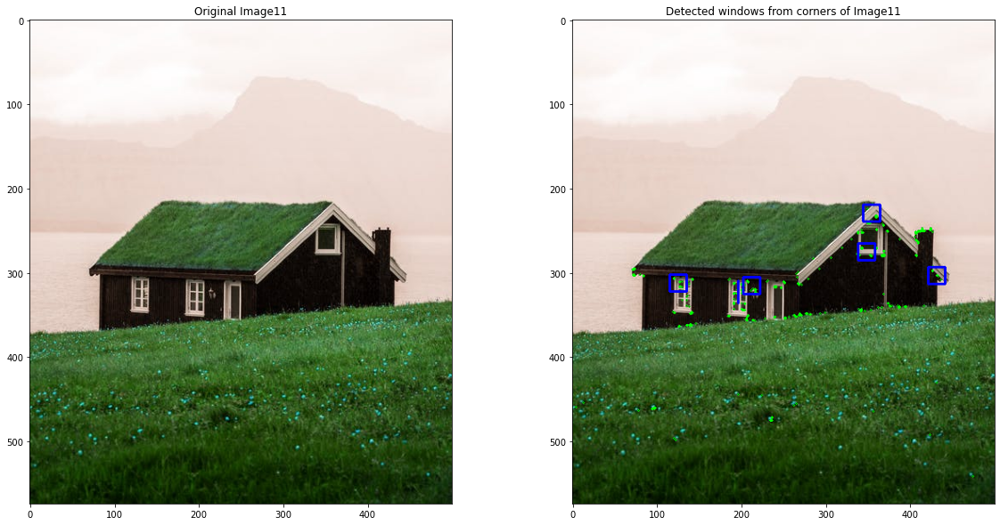

In [95]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image11, cmap='gray')
ax1.set_title('Original Image11')

# Show the second image in the second subplot
ax2.imshow(image_with_rectangles, cmap='gray')
ax2.set_title('Detected windows from corners of Image11')

# Display the figure
plt.show()

The three windows of the house are identified and though the blue squares don't cover their entire object area they indicate on their location quite accurately. There is a fourth blue square that is wrongly placed on the side of the house (end of the roof on the right).

## Exercise 7

### 7.a.

First we visualize the image.

In [96]:
# Get the path of the current script
current_dir = os.getcwd()

In [97]:
# Specify the filename of the image
filename = 'image31.png'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image31 = cv2.imread(image_path)

# Convert the image to RGB color space
image31 = cv2.cvtColor(image31, cv2.COLOR_BGR2RGB)

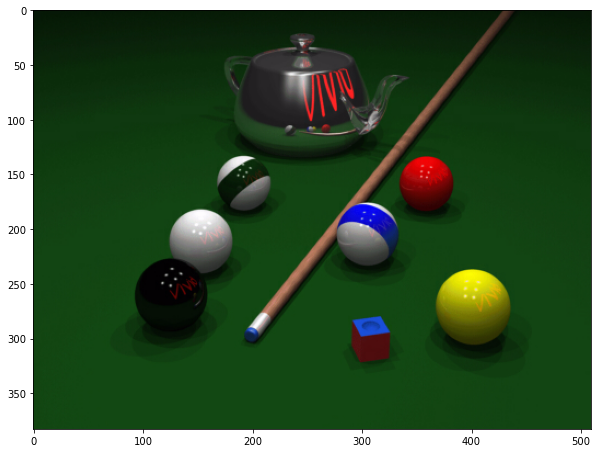

In [98]:
plt.figure(figsize=(10,10))
plt.imshow(image31)

First we will use Canny edge detector and Hough Line Transform to detect the edges and then the lines in the image. Since the only straight-line object is the billiard cue, this will be the only object that will be detected.

In [99]:
image31_copy = image31.copy()

In [100]:
# Convert the image to grayscale
gray = cv2.cvtColor(image31_copy, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur
blurred = cv2.GaussianBlur(gray, (3, 3), 0)

# Apply Canny edge detection
edges = cv2.Canny(gray, 50, 150, apertureSize=3)

# Apply Hough Line Transform to detect the lines
lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=100)

In [101]:
# Iterate through each detected line and draw it on the original image
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a * rho
    y0 = b * rho
    x1 = int(x0 + 1000 * (-b))
    y1 = int(y0 + 1000 * (a))
    x2 = int(x0 - 1000 * (-b))
    y2 = int(y0 - 1000 * (a))
    cv2.line(image31_copy, (x1, y1), (x2, y2), (0, 0, 255), 2)

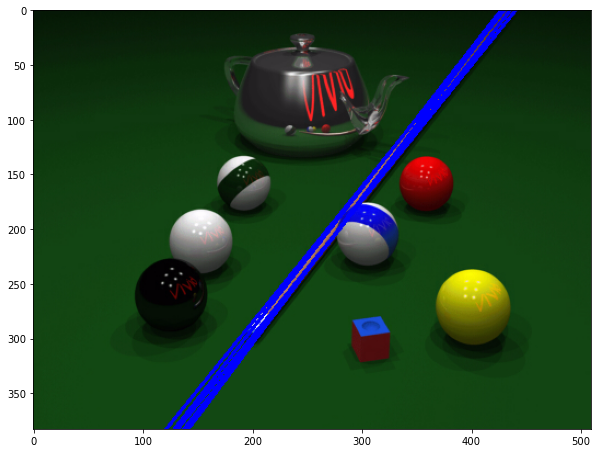

In [102]:
plt.figure(figsize=(10,10))
plt.imshow(image31_copy)

The cue is correctly defined by the blue lines. Multiple lines are detected but they all correspond to different areas of the cue which of course are very similar and close to one another, since the cue is a thin straight-lined object. The angle of the object with respect to the horizontal axis can be detected through the rho and theta values (which define a line) of one of those lines. It is irrelevant which one will be chosen, since all of them are almost stacked on top of one another and thus share almost the exact same angle to the horizontal axis. However, considering miniscule differences in angle between the lines, the first detected line should be the most accurate representation of the strongest line of the cue and therefore this is chosen and the angle of the cue is detected through it.

In [103]:
# Get the first detected line
rho, theta = lines[0][0]

# Calculate the angle between the detected line and the horizontal axis
angle_deg = np.abs(np.degrees(theta) - 90)

print(f"The angle of the billiard cue with respect to the horizontal axis is approximately {angle_deg:.2f} degrees.")


The angle of the billiard cue with respect to the horizontal axis is approximately 51.00 degrees.


The image is then rotated by the detected angle to match the reference Image32.

In [104]:
# Get the image height and width
height, width = image31.shape[:2]

# Rotate the image by the estimated angle
M = cv2.getRotationMatrix2D((width/2, height/2), -angle_deg, 1)
rotated_img = cv2.warpAffine(image31, M, (width, height))


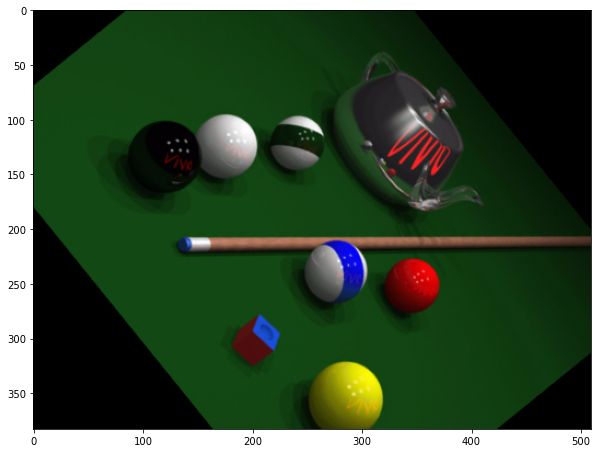

In [105]:
# Show the rotated image
plt.figure(figsize=(10,10))
plt.imshow(rotated_img)

In [106]:
# Convert the rotated image to grayscale
rotated_gray = cv2.cvtColor(rotated_img, cv2.COLOR_BGR2GRAY)

In [107]:
# Specify the filename of the image
filename = 'image32.png'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image32 = cv2.imread(image_path)

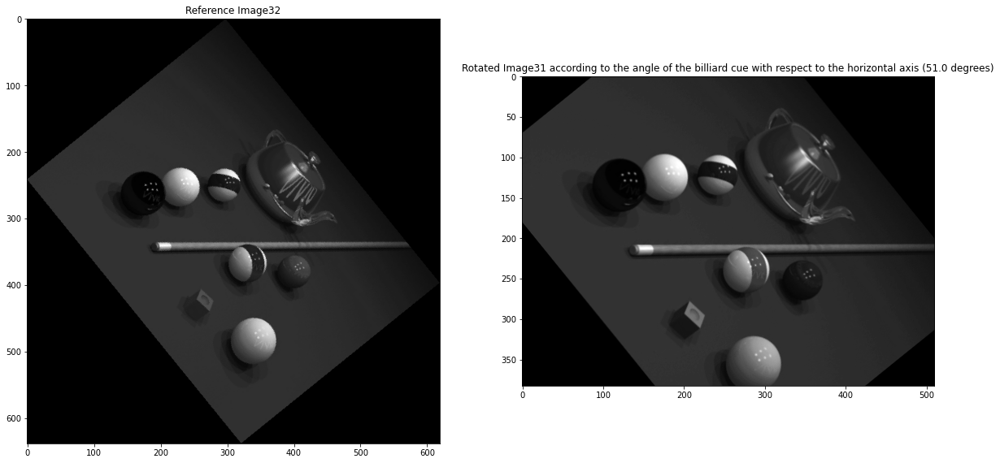

In [108]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image32, cmap='gray')
ax1.set_title('Reference Image32')

# Show the second image in the second subplot
ax2.imshow(rotated_gray, cmap='gray')
ax2.set_title('Rotated Image31 according to the angle of the billiard cue with respect to the horizontal axis (' + str(angle_deg) + ' degrees)')

# Display the figure
plt.show()


It appears that both images are rotated in the exact same way, bringing the cue to a horizontal position parallel to the x axis. Therefore, the calculation of the cue's angle in the original Image31 was accurate.

### 7.b.

To isolate the cue, first we need to remove the balls from consideration, because one of them is connected to the object. This is done in a roundabout way by detecting the circles using the HoughCircles function and then turning their color to the same color as the background, effectively "erasing" them. This way, the cue is isolated from the ball that was connected to it. 

To find the exact color of the background, a sample of the image is taken and its mean color is calculated. The HoughCircles function is used to detect circle objects in the image (the balls) and then those objects are changed to the sampled background color.

In [109]:
# Define a region of the image that only contains the background
bg_region = rotated_img[0:100, 0:100]

# Calculate the mean color of the background region
bg_color = cv2.mean(bg_region)

# Print the mean color of the background
print(bg_color)

(12.7973, 48.4408, 12.9467, 0.0)


In [110]:
rotated_gray_copy = rotated_gray.copy()

# Apply Gaussian blur
blurred = cv2.GaussianBlur(rotated_gray_copy, (3, 3), 0)

# Detect circles using HoughCircles function
circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1, minDist=50, param1=50, param2=30, minRadius=0, maxRadius=30)

# If circles were detected, remove them
if circles is not None:
    # Convert the (x, y) coordinates and radius of the circles to integers
    circles = np.round(circles[0, :]).astype("int")
    
    # Iterate through each circle and remove it from the image
    for (x, y, r) in circles:
        cv2.circle(rotated_gray_copy, (x, y), r, bg_color, -1)
        

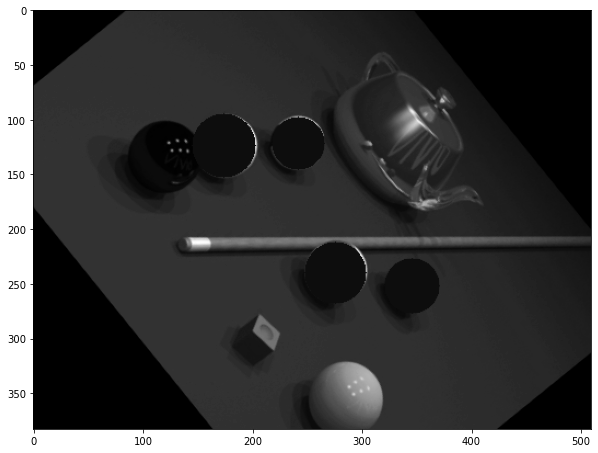

In [111]:
plt.figure(figsize=(10,10))
plt.imshow(rotated_gray_copy, cmap='gray')

Now that the circle connected to the cue is removed from the consideration we can finally isolate the object. This will be done by keeping it intact and turning all other elements of the picture in black. The cue is the only horizontal line (the longest horizontal line also), so to detect it the HoughLinesP function was used. After that a black image (mask) was created with the same dimensions as the image itself and was fit on the image, keeping only the detect cue out of it.

In [112]:
final_image = rotated_gray_copy.copy()

# Apply edge detection
edges_final = cv2.Canny(final_image, 50, 150, apertureSize=3)

# Detect the longest horizontal line using HoughLinesP
lines = cv2.HoughLinesP(edges_final, 1, np.pi/180, 100, minLineLength=100, maxLineGap=10)
longest_line = None
max_length = 0
for line in lines:
    x1, y1, x2, y2 = line[0]
    length = np.sqrt((x2-x1)**2 + (y2-y1)**2)
    if length > max_length and abs(y2-y1) < 5:
        max_length = length
        longest_line = line

# Create a black image with the same dimensions as the original image
mask = np.zeros_like(final_image)

# Draw the longest line on the mask
if longest_line is not None:
    x1, y1, x2, y2 = longest_line[0]
    cv2.line(mask, (x1, y1), (x2, y2), 255, 3)

# Apply the mask to the original image
result = cv2.bitwise_and(final_image, final_image, mask=mask)

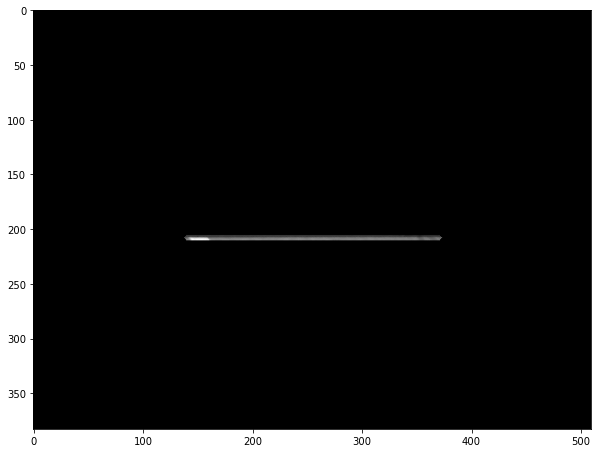

In [113]:
plt.figure(figsize=(10,10))
plt.imshow(result, cmap='gray')

This result is compared below to the reference Image33.

In [114]:
# Specify the filename of the image
filename = 'image33.png'

# Join the current path with the filename
image_path = os.path.join(current_dir, filename)

# Read the image
image33 = cv2.imread(image_path)

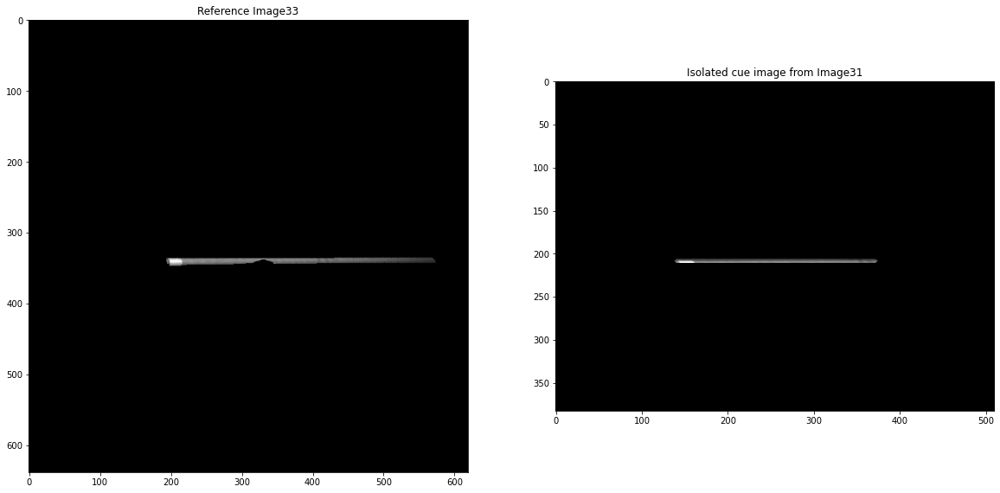

In [115]:
# Create a figure with two subplots
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize = (20,10))

# Show the first image in the first subplot
ax1.imshow(image33, cmap='gray')
ax1.set_title('Reference Image33')

# Show the second image in the second subplot
ax2.imshow(result, cmap='gray')
ax2.set_title('Isolated cue image from Image31')

# Display the figure
plt.show()

As it appears the isolation of the cue was complete and similar to the reference image.

**This is the end of the notebook. Thank you for reading!!**